# Unsupervised Learning Methods
## Outline 
#### 1. Text similarity: cosine similarity, summary extraction
#### 2. Text clusttering: K-mean, visualization with PCA, t-SNE, MDS
#### 3. Build Recommender System

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import plotly.express as px
from PIL import Image

from scipy.stats import entropy
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import linear_kernel
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS

from nltk.corpus import stopwords
import nltk
from wordcloud import WordCloud, STOPWORDS

import re
import string
import json

In [2]:
# download and create the stopwords
nltk.download('stopwords')
add_stopwords = {'well', 'nice', 'good', 'excellent', 'better', 'big', 'great', 'well', 'really', 
                 'taste', 'note', 'notes', 'nose', 'palate', 'aroma', 'flavor', 'color', 'body',
                 'finish', 'year', 'drink', 'long', 'still', 'like', 'one', 'hint', 'hour', 'month', 'bit',
                 'wine', 'bottle'}
stopwords_list = list(set(stopwords.words('english')) | set(stopwords.words('french')) | set(stopwords.words('italian')) | set(stopwords.words('german')) | set(stopwords.words('portuguese')) | set(stopwords.words('spanish')) | add_stopwords)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ymsc1\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# get reviews and perform text vectorization
df = pd.read_pickle("asset/cleaned_reviews.pkl")

def get_reviews_vectorized(df, top_n=-1, ngram_range=(1, 1), max_features=1000):
    review_instances = df.Review.replace('\d+'," ", regex=True)
    review_instances = review_instances.replace(r'\n',' ', regex=True)

    vectorizer = TfidfVectorizer(
        max_df=0.5,
        max_features=max_features,
        min_df=15,
        stop_words=stopwords_list,
        ngram_range=ngram_range,
        use_idf=True,
    )
    if top_n >= 0:
        review_instances = review_instances.values[0:top_n]
        df = df[0:top_n]
    else:
        review_instances = review_instances.values

    X = vectorizer.fit_transform(review_instances)

    return (X, vectorizer)

In [4]:
(X, vectorizer) = get_reviews_vectorized(df, -1, (1, 2))

## 1. Text similarity

In [5]:
cosine_similarities = linear_kernel(X, X)

In [6]:
def recommend(id, cosine_similarities = cosine_similarities):
   
    indices = pd.Series(df.index)
    recommend = []
    
    # Find the index of the input
    idx = indices[indices == id].index[0]
    
    # Find the wines with a similar cosine-sim value and order them from bigges number
    score_series = pd.Series(cosine_similarities[idx]).sort_values(ascending=False)
    
    # Extract top 30 wine indexes with a similar cosine-sim value
    top30_indexes = list(score_series.iloc[0:31].index)
    
    # Collecting idx of the top 30 wines
    for each in top30_indexes:
        recommend.append(list(df.index)[each])
    
    # Creating the new data set to show similar wines
    df_new = pd.DataFrame()
    for each in recommend:
        df_new = df_new.append(pd.DataFrame(df[df.index == each]))
    
    # Sort only the top 10 by the highest rating
    df_new = df_new.sort_values(by='rating', ascending=False).head(10)
    print('Top %s wines like %s with similar reviews: ' % (str(len(df_new)), id))
    
    return df_new



def sample():
    select = df.sample(n=1)
    id = select.index[0]
    print('Select %s ' % id)
    
    return select



def make_wordcloud(text, stop_words, mask):
    # Generate a word cloud image
    wine_mask = np.array(Image.open(mask))
    wordcloud = WordCloud(width = 1200, height = 1200, stopwords=stop_words, scale=10, 
                        colormap = 'YlOrRd', background_color ='black', mask=wine_mask, max_words=100).generate(text)
    plt.figure(figsize=(8,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [7]:
select = sample()
select

Select 7638 


,name,year,wine ID,rating,price,winery,image,Review,country
7638,Palette Blanc 2013,2013,99629,4.1,68.0,Château Simone,//images.vivino.com/thumbs/qszuaBAISJ-VtguKdXA...,The most exclusive rose I have ever tasted. Gr...,France


In [8]:
select_idx = select.index[0]
recomendation = recommend(select_idx)
recomendation

Top 10 wines like 7638 with similar reviews: 


C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\2575768213.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df[df.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\2575768213.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df[df.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\2575768213.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df[df.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\2575768213.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new

,name,year,wine ID,rating,price,winery,image,Review,country
5122,Clos de la Coulée de Serrant 2019,2019,100492,4.5,90.954201,Nicolas Joly,//images.vivino.com/thumbs/BCPN1iA2S5exukHzhfW...,4.6 a lovely wine. Creamy butter aromas A cre...,France
9746,Palette Blanc 2018,2018,99629,4.3,40.529533,Château Simone,//images.vivino.com/thumbs/qszuaBAISJ-VtguKdXA...,What the heck!? What’s this? Behind an unassum...,France
7857,Clos de la Coulée de Serrant 2014,2014,100492,4.3,140.000000,Nicolas Joly,//images.vivino.com/thumbs/BCPN1iA2S5exukHzhfW...,My third Coulée de Serrant and the first that ...,France
8994,Clos de la Coulée de Serrant 2012,2012,100492,4.3,176.946014,Nicolas Joly,//images.vivino.com/thumbs/BCPN1iA2S5exukHzhfW...,Outstanding complex and rich Chenin Blanc for ...,France
9484,Clos de la Coulée de Serrant 2015,2015,100492,4.3,99.841042,Nicolas Joly,//images.vivino.com/thumbs/BCPN1iA2S5exukHzhfW...,Still young but what a wine. Very complex. Unr...,France
9865,Les Vieux Clos 2019,2019,2457974,4.2,42.506584,Nicolas Joly,//images.vivino.com/thumbs/jneLVSLlSke6lcNqFd1...,"On the nose: honeydew melon, cantaloupe, clove...",France
8579,Cartology (Bush Vines) 2019,2019,1391618,4.2,45.472160,Alheit Vineyards,//images.vivino.com/thumbs/APiQpyhVRzCLD6M-ym0...,Nose: cream from the oak and citrus Taste: pea...,South Africa
5005,Clos de Mosny 2019,2019,1554137,4.2,32.127068,La Taille Aux Loups,//images.vivino.com/thumbs/oVZ6TMlmTlyqCKpc7QC...,Really surprised me. Mineral and crisp but yet...,France
3367,Châteauneuf-du-Pape Blanc 2011,2011,10975,4.2,130.568436,Château de Beaucastel,//images.vivino.com/thumbs/8J8u56HSRYe1_BKaUGY...,"Simply fabulous. Tasted blind, I was seduced a...",France
7677,Palette Blanc 2012,2012,99629,4.2,62.000000,Château Simone,//images.vivino.com/thumbs/qszuaBAISJ-VtguKdXA...,Very mellow ripe slightly vanilla tinged yello...,France


This is the wordcloud of the select wine looks like...


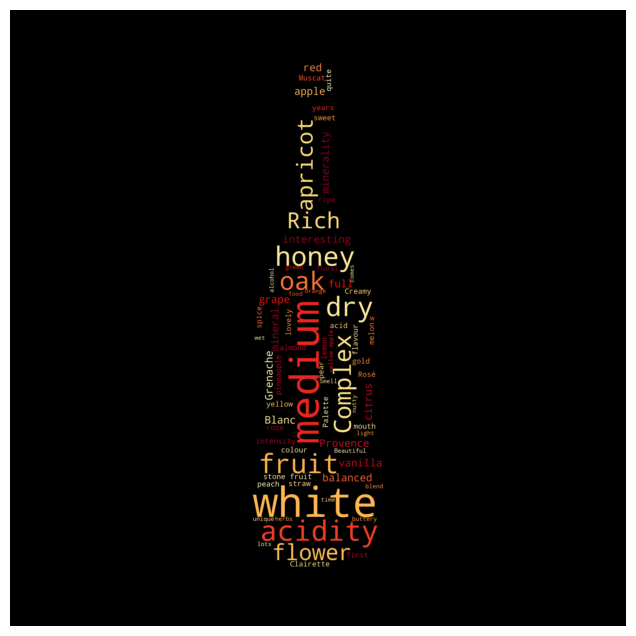

This is the wordcloud of the recommendation list looks like...


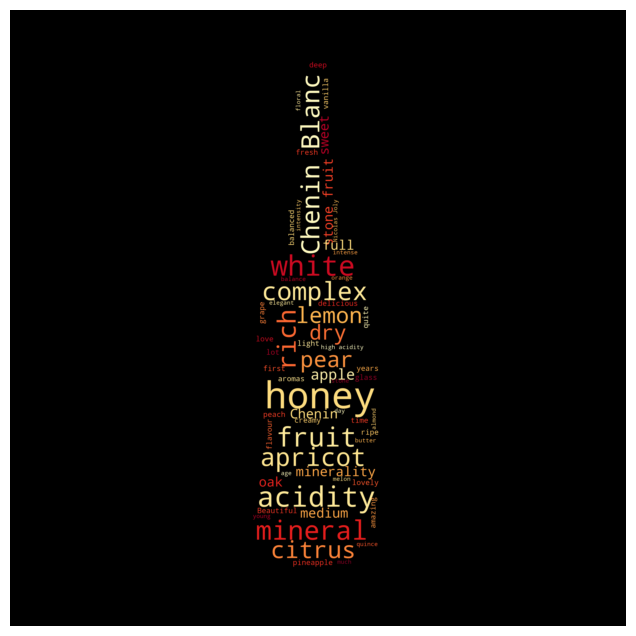

In [9]:
recomendation_review = ' '.join(recomendation.Review.tolist())
select_review = select.Review.item()
print('This is the wordcloud of the select wine looks like...')
make_wordcloud(select_review, stopwords_list, "picture/wine_image.jpg")
print('This is the wordcloud of the recommendation list looks like...')
make_wordcloud(recomendation_review, stopwords_list, "picture/wine_image.jpg")

## 2. Text clusttering

#### Firstly, try k-means by two categories.

In [10]:
def kmeans_review_k_2():
    result = None
   
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    centroids = km.cluster_centers_
    features = vectorizer.get_feature_names()    
    sorted_centroid_features_idx = centroids.argsort(axis=1)[:,::-1]    
    top10_clust1 = [features[feature_idx] for feature_idx in sorted_centroid_features_idx[0]][:10]
    top10_clust2 = [features[feature_idx] for feature_idx in sorted_centroid_features_idx[1]][:10]
    result = [top10_clust1, top10_clust2]

    return result


kmeans_review_k_2()

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


[['bordeaux',
  'merlot',
  'cabernet',
  'cab',
  'barolo',
  'brunello',
  'syrah',
  'rioja',
  'pinot',
  'sangiovese'],
 ['apple',
  'citrus',
  'lemon',
  'champagne',
  'pear',
  'peach',
  'honey',
  'bubbles',
  'brioche',
  'yellow']]

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


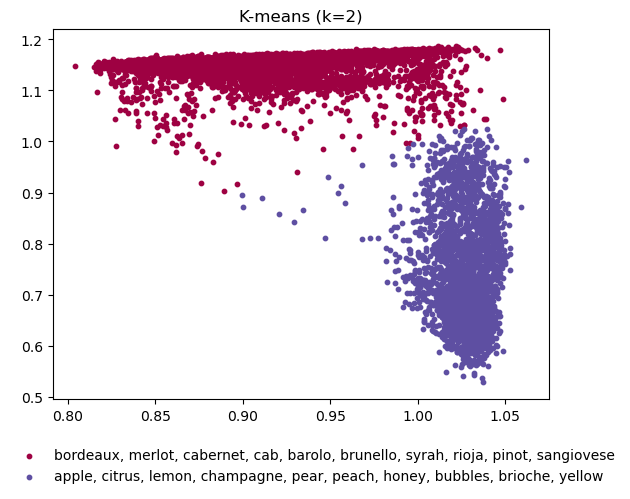

In [11]:
# from matplotlib.legend_handler import HandlerLine2D, HandlerTuple


def scatter_plot():
    colors = cm.Spectral(np.linspace(0, 1, 2))
    cdict = {0: colors[0], 1: colors[1]}
    
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    X_km = km.transform(X_ar)
    y = km.fit_predict(X_ar)
    label1 = ', '.join(kmeans_review_k_2()[0])
    label2 = ', '.join(kmeans_review_k_2()[1])

    fig, ax = plt.subplots()
    for cls in np.unique(y):
        ix = np.where(y == cls)
        ax.scatter(X_km[ix, 0], X_km[ix, 1], color = cdict[cls], label = cls, s = 10)
    ax.legend((label1, label2), bbox_to_anchor=(-0.1, -0.1), loc='upper left', frameon=False)
    ax.set_title('K-means (k=2)')
    plt.show()


scatter_plot()

In [12]:
', '.join(kmeans_review_k_2()[0])

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


'bordeaux, merlot, cabernet, cab, barolo, brunello, syrah, rioja, pinot, sangiovese'

In [13]:
def km_2_by_plotly(X, title):
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    X_km = km.transform(X_ar)
    y = km.fit_predict(X_ar)

    labels = [', '.join(wd) for wd in np.array(kmeans_review_k_2())[y]] 
    df_km = pd.DataFrame(X_km, columns=['x', 'y'])
    df_km['labels'] = labels
    df_plot = pd.concat([df_km, df], axis=1)


    fig = px.scatter(
    df_plot, x='x', y='y',
    color='labels', title=title, 
    hover_data=['name', 'country', 'winery', 'price', 'rating']
    )
    fig.write_json("plotly/%s.json" % title)
    fig.show()

km_2_by_plotly(X, 'K-means')

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


#### Interesting! It seems the k-means finds two discrete categories, the "red" and the "white"! There are more categories for wines! <br>We want to explore the optimal number of clusters using the elbow method. 

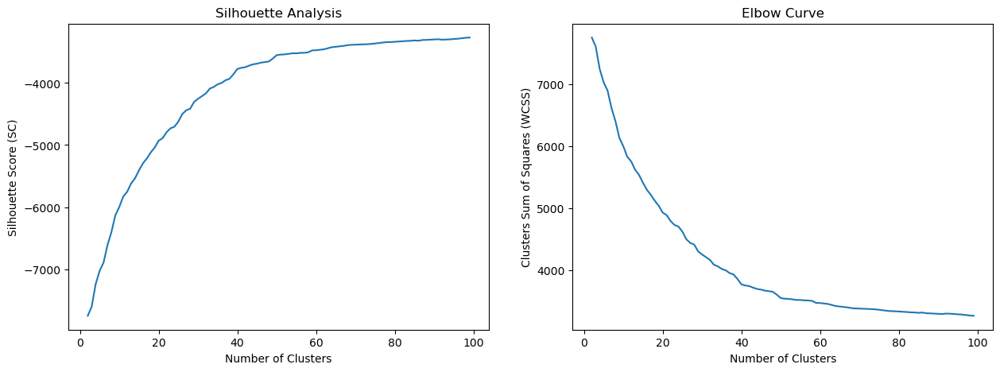

In [14]:
# elbow curve for exploring k values for KNN
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
X_ar = X.toarray()
Nc = range(2, 100)

kmeans = [KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=1, random_state=42) for i in Nc]
sc = [kmeans[i].fit(X_ar).score(X_ar) for i in range(len(kmeans))]
wcss = [kmeans[i].fit(X_ar).inertia_ for i in range(len(kmeans))]



axes[0].plot(Nc,sc)
axes[0].set_xlabel('Number of Clusters')
axes[0].set_ylabel('Silhouette Score (SC)')
axes[0].set_title('Silhouette Analysis')

axes[1].plot(Nc,wcss)
axes[1].set_xlabel('Number of Clusters')
axes[1].set_ylabel('Clusters Sum of Squares (WCSS)')
axes[1].set_title('Elbow Curve')


plt.show()

#### The optimal number of clustters is near 30. We set k=30 for the K-means. <br>Next, we want create labels for each cluster by extracting discrete words in the reviews of each wine.

In [15]:
k_val=32

In [16]:
def compute_distinctive_term_score(T, T_a):
    # First compute information gain.
    IG = entropy(T) - entropy(T_a)

    # if it's high IG, but not for this class, we want to penalize,
    # so flip the IG negative.  We do this because these are terms those whose *absence* is notable,
    # but we don't care about those for purposes of this assignment and so we give them
    # a score that guarantees we won't rank them highly.
    if T_a[0] < T_a[1]:
        score = -IG
    else:
        score = IG
    return score


# create a 1-vs-all two-class matrix for each cluster
def one_vs_all_count_matrix(m, index):
    # row zero is the selected row
    row0 = m[index, :]
    # row one is the other rows summed
    row1 = np.vstack((m[0:index, :], m[index + 1 :, :])).sum(axis=0)

    result = np.vstack((row0, row1))
    return result

In [17]:
def answer_cluster_labeling(n_clusters):
    result = None

    X_ar = X.toarray()
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    centroids = km.cluster_centers_
    ig = np.empty([n_clusters, 1000])
    for c in range(n_clusters):
        tc = one_vs_all_count_matrix(centroids, c).sum(axis=1)/one_vs_all_count_matrix(centroids, c).sum(axis=1).sum(axis=0)
        for w in range(1000):
            tw = one_vs_all_count_matrix(centroids, c)[:,w]/one_vs_all_count_matrix(centroids, c).sum(axis=0)[w]
            ig[c,w] = compute_distinctive_term_score(tc, tw)
    features = vectorizer.get_feature_names()    
    sorted_ig_idx = ig.argsort(axis=1)[:,::-1] 
    result = []
    for c in range(n_clusters):
        result.append([features[feature_idx] for feature_idx in sorted_ig_idx[c]][:5])
    return result


answer_cluster_labeling(k_val)

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



[['cab', 'cabernet', 'cab sauv', 'cab franc', 'cabernet sauvignon'],
 ['bubbly', 'bubbles', 'brut', 'fine bubbles', 'apple pear'],
 ['tar', 'nebbiolo', 'roses', 'rose petal', 'petal'],
 ['natural', 'grape', 'funky', 'variety', 'italy'],
 ['blanc', 'grass', 'tropical', 'tropical fruits', 'tropical fruit'],
 ['bordeaux blend', 'left bank', 'bordeaux', 'sauvignon merlot', 'pencil'],
 ['reserva', 'tempranillo', 'modern', 'coconut', 'american'],
 ['pn', 'pinot noir', 'noir', 'burgundy', 'strawberry cherry'],
 ['bordeaux blend', 'purple colour', 'inky', 'petit verdot', 'verdot'],
 ['raisins', 'caramel', 'figs', 'raisin', 'walnut'],
 ['pink', 'salmon', 'rose', 'summer', 'melon'],
 ['raisin', 'raisins', 'dried fruit', 'cherry chocolate', 'prune'],
 ['sangiovese', 'friday', 'tuscany', 'leather cherry', 'cherry tobacco'],
 ['tar', 'rose petal', 'petal', 'roses', 'leather cherry'],
 ['spain', 'spanish', 'reserva', 'american', 'vanilla blackberry'],
 ['sangiovese', 'tuscany', 'pizza', 'tomato', 'p

In [18]:
def answer_manifold_a():
    result = None

    # YOUR CODE HERE
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)

    pca = PCA(n_components=2, random_state = 42)
    X_pca = pca.fit_transform(X_ar)
    
    tsne = TSNE(n_components=2, random_state = 42)
    X_tsne = tsne.fit_transform(X_ar)
    
    mds = MDS(n_components=2, random_state = 42)
    X_mds = mds.fit_transform(X_ar)

    result = (X_pca, X_tsne, X_mds)
    return result

X_pca, X_tsne, X_mds = answer_manifold_a()

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 

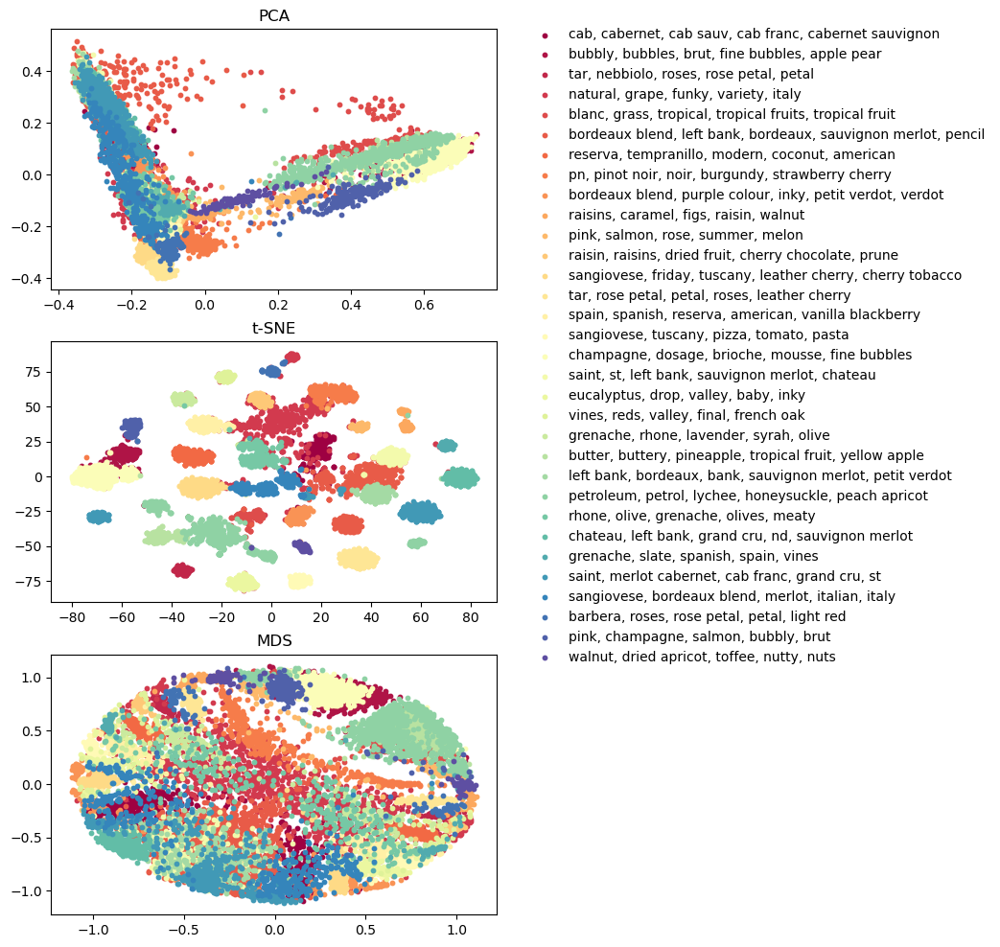

In [19]:
def plot_manifolds():
    colors = cm.Spectral(np.linspace(0, 1, k_val))
    fig, ax = plt.subplots(3, 1, figsize=(6, 12))

    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    labels = [', '.join(answer_cluster_labeling(k_val)[i]) for i in range(k_val)]


    for cls in np.unique(y):
        ix = np.where(y == cls)
        ax[0].scatter(X_pca[ix, 0], X_pca[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[0].set_title('PCA')

        ax[1].scatter(X_tsne[ix, 0], X_tsne[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[1].set_title('t-SNE')

        ax[2].scatter(X_mds[ix, 0], X_mds[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[2].set_title('MDS')
    plt.legend(labels, bbox_to_anchor=(1.05, 3.45), loc='upper left', frameon=False)
    plt.show()

plot_manifolds()

#### Same visualizations build on Plotly. Enjoy the interactive experiences!

In [20]:
def scatterplot_by_plotly(X, manifolds, title):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    labels = [', '.join(wd) for wd in np.array(answer_cluster_labeling(k_val))[y]] 
    df_manifolds = pd.DataFrame(manifolds, columns=['x', 'y'])
    df_manifolds['labels'] = labels
    df_plot = pd.concat([df_manifolds, df], axis=1)


    fig = px.scatter(
    df_plot, x='x', y='y',
    color='labels', title=title, 
    hover_data=['name', 'country', 'winery', 'price', 'rating']
    )
    fig.write_json("plotly/%s.json" % title)
    fig.show()

In [21]:
scatterplot_by_plotly(X, X_pca, "PCA")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [22]:
scatterplot_by_plotly(X, X_tsne, "t-SNE")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [23]:
scatterplot_by_plotly(X, X_mds, "MDS")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



## 3. Build Recommender System

In [24]:
def get_mean_vector(idx_list):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)  
    indices = pd.Series(df.index)
    vectors = []
    
    for wine in idx_list:
        idx = indices[indices == wine].index[0]
        vector = km.transform(X_ar[idx].reshape(1, -1))
        vectors.append(vector)  
    
    song_matrix = np.array(list(vectors))
    return np.mean(song_matrix, axis=0)




def recommend_knn(wine_list):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    wine_data = km.transform(X_ar)

    # Find the wines with a similar cosine-sim value and order them from bigges number
    wine_center = get_mean_vector(wine_list).reshape(1, -1)
    distances = cdist(wine_center, wine_data, 'cosine')

    # Extract top 30 wine indexes with a similar cosine-sim value
    top30_indexes = list(np.argsort(distances)[:, :30][0])

    # Creating the new data set to show similar wines
    df_new = pd.DataFrame()
    for each in top30_indexes:
        df_new = df_new.append(pd.DataFrame(df[df.index == each]))

    # Sort only the top 10 by the highest rating
    df_new = df_new.sort_values(by='rating', ascending=False).head(10)
    print('Top wines with similar reviews according to the user list: ')

    return df_new




def sample_list(n=5):
    select = df.sample(n)
    select_idx = select.index.tolist()
    for idx in select_idx:
        print('Select %s ' % idx)
    
    return select

In [25]:
sample_list = sample_list(5)
sample_idx_list = sample_list.index.tolist()
sample_list

Select 7602 
Select 3195 
Select 8722 
Select 1802 
Select 673 


,name,year,wine ID,rating,price,winery,image,Review,country
7602,Moonlight Race Pinot Noir 2016,2016,3851587,3.9,45.000000,Burn Cottage,//images.vivino.com/thumbs/Ff6Bbcz_Q_uXjM8n0Ky...,"88 Aroma had raspberries, currants, herbs and ...",New Zealand
3195,Inspiration Rosé 2021,2021,6324906,3.8,111.367195,Château de Berne,//images.vivino.com/thumbs/IkI9gb0oRgWRk1JQxAY...,Light salmon color. Aromas and flavors of stra...,France
8722,Ca' Florian Amarone della Valpolicella Classic...,2010,1913675,4.4,107.749245,Tommasi,//images.vivino.com/thumbs/9O6AHHvsQC6j2jWj3Sa...,"Deep and intense nose with notes of plum, dark...",Italy
1802,Bin 389 Cabernet - Shiraz 2019,2019,24056,4.2,71.668076,Penfolds,//images.vivino.com/thumbs/6GQaBiW3T96j336QA6p...,The Bin 389 is sometimes nicknamed ‘baby Grang...,Australia
673,Anderson Valley Pinot Noir 2017,2017,10400,4.4,59.074265,Goldeneye,//images.vivino.com/thumbs/XpE2TjCpRsmSyxF2Lma...,Smooth well balanced with mild tannins. Notes ...,United States


In [26]:
recomendation_list = recommend_knn(sample_idx_list)
recomendation_list

Top wines with similar reviews according to the user list: 


C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\3433771424.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\3433771424.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\3433771424.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\3433771424.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_5228\3433771424.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

,name,year,wine ID,rating,price,winery,image,Review,country
3038,Vigne de l'Enfant Jésus Beaune 1er Cru 'Les Gr...,2017,13465,4.5,154.249969,Bouchard Père & Fils,//images.vivino.com/thumbs/AWVPT7DgS7ecTsK7mLB...,Cote de Beaune tasting - New 2017 vintage (cas...,France
5435,Savigny-Lés-Beaune 'Les Goudelettes' 2017,2017,1640892,4.2,42.457157,Domaine Antonin Guyon,//images.vivino.com/thumbs/WcZ71GnMTm-cGm6Ip42...,Hedonistic level- medium plus Pale ruby in ey...,France
4021,Elles Madine & Agnes 2018,2018,9369491,4.2,48.003101,Jean Foillard,//images.vivino.com/thumbs/ScXvWkxRQkyeM2mrtvX...,Made by Jean Foillards wife Agnes and her frie...,France
5568,Clos de la Perrière Monopole Bourgogne Rouge 2018,2018,5837949,4.1,26.195917,Clos du Moulin Aux Moines,//images.vivino.com/thumbs/cZ0VhH_3TNWWupfKLCL...,Nose: Strawberry and raspberry. And a lot of f...,France
7392,DD Rouge 2018,2018,2565047,4.1,40.000000,Bénédicte et Stéphane Tissot,//images.vivino.com/thumbs/px2mtG4uQZKW3hxCoUb...,🤩 what a wine hints of salty liquorice and Cac...,France
5702,Côte de Nuits-Villages 2011,2011,1128923,4.1,49.327408,Jayer Gilles,//images.vivino.com/thumbs/YuRC-Zj6SkOaYnlfGMa...,"4.0. Red berries, spices, vanilla - from new o...",France
5436,Auxey-Duresses 2017,2017,3005552,4.1,27.579853,Domaine Jean & Gilles Lafouge,//images.vivino.com/thumbs/-59Ljk_7STm9kq6McGy...,A rich red fruit profile with a surprisingly d...,France
4013,Côte de Brouilly 2019,2019,6121470,4.0,51.843349,Alex Foillard,//images.vivino.com/thumbs/wn2U883vRFyrmVAEida...,"Light red, almost pinkish hue, somewhat darker...",France
7257,Morgon 2014,2014,1178261,4.0,59.000000,Domaine Marcel Lapierre,//images.vivino.com/thumbs/52QQCh_mTeqHcqbgTPc...,Fresh and fruity with raspberry notes - great ...,France
4958,Marsannay 2017,2017,3111030,4.0,29.556904,Chanson,//images.vivino.com/thumbs/upuZWSGPRfGgbiUxWYh...,"High acidity and medium body, strawberry and r...",France


This is the wordcloud of the user list looks like...


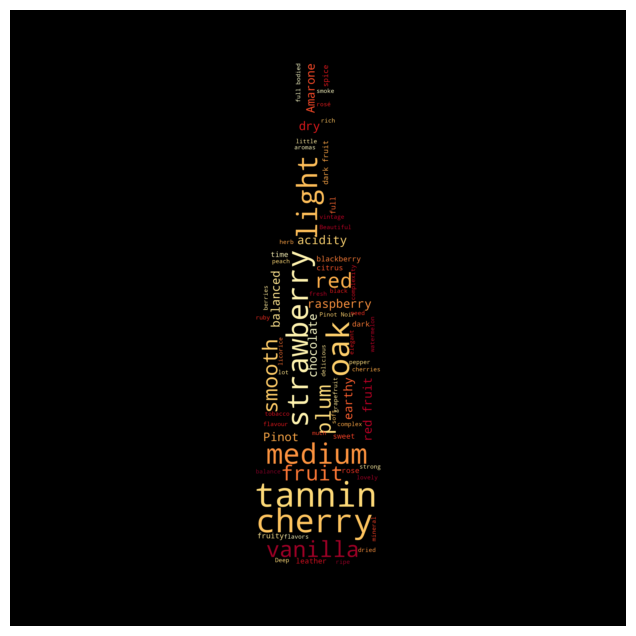

This is the wordcloud of the recommendation list looks like...


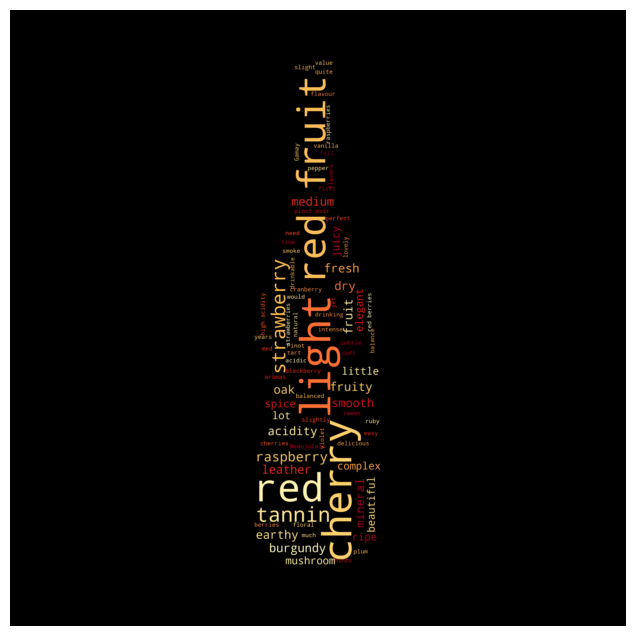

In [27]:
user_sample_1_review = ' '.join(sample_list.Review.tolist())
print('This is the wordcloud of the user list looks like...')
make_wordcloud(user_sample_1_review, stopwords_list, "picture/wine_image.jpg")
recomendation_list_review = ' '.join(recomendation_list.Review.tolist())
print('This is the wordcloud of the recommendation list looks like...')
make_wordcloud(recomendation_list_review, stopwords_list, "picture/wine_image.jpg")